## Data Collection, Cleansing and Analysis

### Data Collection :  Placing a Restaurent is dependent on many Factors such as the 

   1. Most Visiting places in New_York, so that sustain from competition and achieve Breakeven quickly.
   2. Types of Cusine in New_York,  so that the new restaurent can be places at most visiting places and 
         at the same time little far from the Famous
   3. Also the Top 5 Type of Cusine in each Borough of New_York City
   
   4. Neighbourhood Analysis to recommend the Cusine
   5. Farmer Markets and commercial markets details to analyze the City/Borough ranges for reducing the transporatino cost.
   

### Data Collection : 

### Import/Install the required Packages

In [106]:
!pip install wikipedia
!pip install lxml
!pip install geocoder
!pip install folium
!pip install geopy

In [107]:
import pandas as pd
import wikipedia as wp
import numpy as np
import lxml as html
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
from geopy.geocoders import Nominatim
import folium
from sklearn.metrics import silhouette_score

#### Download the New_York city Demographics & Cusine detials in Borough from Wikipedia

In [108]:
#Get the html source
html = wp.page("Demographics of New York City").html().encode("UTF-8")
Data_Frame = pd.read_html(html)[0]

In [109]:
NY_Data_Table = pd.DataFrame(Data_Frame)

#Refering the Columns in Multiindexed table
#NY_Data_Table.iloc[:, NY_Data_Table.columns.get_level_values(2)=='Borough']

NY_Data_Table[0:5]

New York City's five boroughsvte                                \
                      Jurisdiction                    Population   
                           Borough    County Estimate (2017)[12]   
0                        The Bronx     Bronx             1471160   
1                         Brooklyn     Kings             2648771   
2                        Manhattan  New York             1664727   
3                           Queens    Queens             2358582   
4                    Staten Island  Richmond              479458   

                                                                \
  Gross Domestic Product                    Land area            
       billions(US$)[13] per capita(US$) square miles squarekm   
0                 28.787           19570        42.10   109.04   
1                 63.303           23900        70.82   183.42   
2                629.682          378250        22.83    59.13   
3                 73.842           31310       108.53   281.09   
4                 11.249           23460        58.37   151.18   

                                    
           Density                  
  persons / sq. mi persons /sq. km  
0            34653           13231  
1            37137           14649  
2            72033           27826  
3            21460            8354  
4             8112            3132

In [110]:
NY_Cusines_Data = pd.read_csv('C:\\Users\\KALPANASATYA\\Desktop\\NY_Cusines.csv')

#NY_Cusines = NY_Cusines.sort_values(by=['Neighborhood'], ascending=False)


# ***NY_Cusines.loc[('The Bronx'), :] ***

#NY_Cusines_All = NY_Cusines.loc[('The Bronx',), :]
#NY_Cusines_All


NY_Cusines_Data.head()

,Borough,Neighborhood,Cuisine
0,The Bronx,Bedford Park,Mexican
1,The Bronx,Bedford Park,Puerto Rican
2,The Bronx,Bedford Park,Dominican
3,The Bronx,Bedford Park,Korean
4,The Bronx,Belmont,Italian


## Pictorial Presentation fo Top Cusines in New_York using WordCloud

In [111]:
from wordcloud import WordCloud, STOPWORDS
stopwords = set(STOPWORDS)

WC_Cusines_Data = NY_Cusines_Data['Cuisine'].to_string()

WC_NY = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

WC_NY.generate(WC_Cusines_Data)

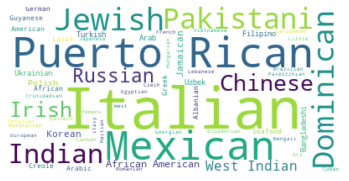

<Figure size 2160x3240 with 0 Axes>

In [112]:
import matplotlib as mpl
import matplotlib.pyplot as plt

plt.imshow(WC_NY, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

### Top 10 Cuisine in New York City

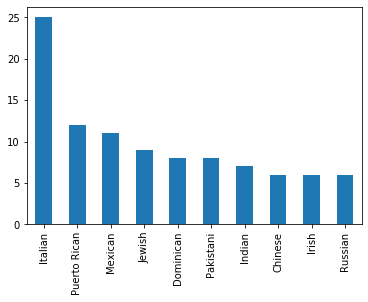

In [113]:
Temp = pd.DataFrame( NY_Cusines_Data['Cuisine'].value_counts() )

NY_Cusines_Data['Cuisine'].value_counts()[0:10].plot( kind = 'bar')

In [114]:
Temp = NY_Cusines_Data.groupby(['Borough', 'Cuisine']).count()
Temp = Temp.sort_values(by=['Borough','Neighborhood'], ascending=False)

NY_Borough_Top_Cusines = Temp.xs('Brooklyn', level=0, axis=0, drop_level=False)[0:5]
NY_Borough_Top_Cusines = NY_Borough_Top_Cusines.append(Temp.xs('The Bronx', level=0, axis=0, drop_level=False)[0:5] )
NY_Borough_Top_Cusines = NY_Borough_Top_Cusines.append(Temp.xs('Manhattan', level=0, axis=0, drop_level=False)[0:5] )
NY_Borough_Top_Cusines = NY_Borough_Top_Cusines.append(Temp.xs('Queens', level=0, axis=0, drop_level=False)[0:5] )
NY_Borough_Top_Cusines = NY_Borough_Top_Cusines.append(Temp.xs('Staten Island', level=0, axis=0, drop_level=False)[0:5] )
NY_Borough_Top_Cusines.unstack()
NY_Borough_Top_Cusines

Neighborhood
Borough       Cuisine                       
Brooklyn      Italian                     10
              Puerto Rican                 7
              Mexican                      5
              African-American             4
              Jamaican                     4
The Bronx     Italian                      3
              Albanian                     2
              Dominican                    2
              Puerto Rican                 2
              Filipino                     1
Manhattan     Italian                      6
              Puerto Rican                 3
              Dominican                    2
              Indian                       2
              Jewish                       2
Queens        Indian                       3
              Irish                        3
              Italian                      3
              Mexican                      3
              Pakistani                    3
Staten Island Italian                      3
              Indian                       2
              Arab                         1
              Mexican                      1
              Pakistani                    1

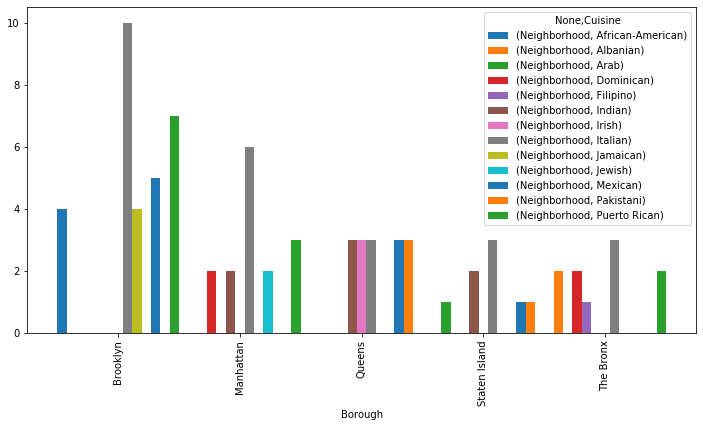

In [115]:
NY_Borough_Top_Cusines.unstack().plot( kind = 'bar', width = 1, figsize=(12, 6), legend = 'Cuisine')
#plt.xlabel(NY_Borough_Top_Cusines.xs)

## Part 2 Analyzing Farmer Markets

In [116]:
NY_Farmer_Market = pd.read_csv("C:\\Users\\KALPANASATYA\\Desktop\\DOHMH_Farmers_Markets.csv")
NY_Farmer_Market.head()

,Borough,Market Name,Street Address,Latitude,Longitude,Days of Operation,Hours of Operations,Season Dates,Accepts EBT,Open Year-Round,Stellar Cooking Demonstrations,Food Activities for Kids
0,Brooklyn,Urban Oasis Farmers Market,681 Clarkson Ave,40.656255,-73.936608,Wednesday,2 - 5:30 p.m.,06/26/2019-11/06/2019,No,No,No,No
1,Staten Island,Staten Island Mall Greenmarket,Marsh Ave & Ring Rd,40.583804,-74.161245,Saturday,8 a.m. - 3 p.m.,Year-Round,Yes,Yes,No,No
2,Manhattan,Mount Sinai Hospital Greenmarket,E 99th St bet Madison & Park Aves,40.789169,-73.952743,Wednesday,8 a.m. - 5 p.m.,06/12/19-11/27/19,Yes,No,No,No
3,Bronx,170 Farm Stand,E 170th St & Townsend Ave,40.839882,-73.916783,Wednesday,2:30 - 6:30 p.m.,07/10/2019-11/27/2019,Yes,No,No,Yes
4,Manhattan,Grass Roots Farmers Market,"W 145th St bet Edgecombe & Bradhurst Aves, at ...",40.823647,-73.943844,Tuesday &\nSaturday,9 a.m. - 4 p.m.,07/11/2019-11/21/2019,Yes,No,No,No


In [117]:
address = 'New York'
geolocator = Nominatim(user_agent="Explore_NY")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

NY_Map = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='Stamen Terrain')

for lat, lng, borough, neighborhood in zip(NY_Farmer_Market['Latitude'], NY_Farmer_Market['Longitude'], 
                                           NY_Farmer_Market['Borough'], NY_Farmer_Market['Market Name']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='Red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(NY_Map)  
    
    
NY_Map

### Download and Explore New York city geographical coordinates dataset

Neighborhood has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood. 

Luckily, this dataset exists for free on the web. Link to the dataset: https://geo.nyu.edu/catalog/nyu_2451_34572

In [118]:
import json
with open('C:\\Users\\KALPANASATYA\\Desktop\\nyu_2451_34572-geojson.json') as json_data:
    newyork_data = json.load(json_data)

In [119]:
neighborhoods_data = newyork_data['features']

In [120]:
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

Transform the Data to Data Frame

In [121]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [122]:
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [123]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [124]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [125]:
neighborhoods.to_csv('BON1_NYC_GEO.csv',index=False)

In [126]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


### Create a map of New York with neighborhoods superimposed on top

In [127]:
# create map of Toronto using latitude and longitude values
map_NewYork = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='Stamen Terrain')

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_NewYork)  
    
map_NewYork

In [128]:
NYC_Geo=pd.read_csv('BON1_NYC_GEO.csv')

In [129]:
NYC_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [130]:
NYC_Geo['Borough'].value_counts().to_frame()

,Borough
Queens,81
Brooklyn,70
Staten Island,63
Bronx,52
Manhattan,40


In [131]:
NYC_Geo.shape

(306, 4)

In [132]:
print(NYC_Geo.Borough.unique())
NYC_Geo.isnull().sum()

['Bronx' 'Manhattan' 'Brooklyn' 'Queens' 'Staten Island']


Borough         0
Neighborhood    0
Latitude        0
Longitude       0
dtype: int64

## Segmenting and Clustering Neighborhoods -  Brooklyn and Manhattan

In [133]:
BM_Geo = NYC_Geo.loc[(NYC_Geo['Borough'] == 'Brooklyn')|(NYC_Geo['Borough'] == 'Manhattan')]
BM_Geo = BM_Geo.reset_index(drop=True)
BM_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Brooklyn,Bay Ridge,40.625801,-74.030621
2,Brooklyn,Bensonhurst,40.611009,-73.995180
3,Brooklyn,Sunset Park,40.645103,-74.010316
4,Brooklyn,Greenpoint,40.730201,-73.954241


***Use geopy library to get the latitude and longitude values of New York City. The geograpical coordinate of New York City are 40.7308619, -73.9871558..***

In [134]:
import time
start_time = time.time()

address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

print("--- %s seconds ---" % round((time.time() - start_time), 2))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.
--- 0.93 seconds ---


In [135]:
# create map of Toronto using latitude and longitude values
map_BM = folium.Map(location=[latitude, longitude], zoom_start=10, tiles='Stamen Terrain')

# add markers to map
for lat, lng, borough, neighborhood in zip(BM_Geo['Latitude'], BM_Geo['Longitude'], BM_Geo['Borough'], BM_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_BM)  
    
map_BM

## Exploring FourSquare - Neighbour hood Data

In [149]:
import requests # library to handle requests
#Access to FourSquare

CLIENT_ID = 'OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL' # your Foursquare ID
CLIENT_SECRET = 'VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T' # your Foursquare Secret
VERSION = '20181231' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL
CLIENT_SECRET:VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T


In [150]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(
            CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)
             
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [151]:
BM_venues = getNearbyVenues(names = BM_Geo['Neighborhood'], latitudes=BM_Geo['Latitude'], longitudes=BM_Geo['Longitude'])

BM_venues.to_csv('BM_venues.csv', sep=',', encoding='UTF8')
BM_venues.head()

Marble Hill
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,The Bar Room at Temple Court,40.711448,-74.006802,Hotel Bar
1,Marble Hill,40.876551,-73.91066,The Beekman - A Thompson Hotel,40.711173,-74.006702,Hotel
2,Marble Hill,40.876551,-73.91066,City Hall Park,40.712415,-74.006724,Park
3,Marble Hill,40.876551,-73.91066,Alba Dry Cleaner & Tailor,40.711434,-74.006272,Laundry Service
4,Marble Hill,40.876551,-73.91066,The Wooly Daily,40.712137,-74.008395,Coffee Shop


In [152]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
BM_venues = pd.read_csv('BM_venues.csv', skiprows=1, names=colnames)
BM_venues.columns = BM_venues.columns.str.replace(' ', '')
BM_venues = pd.DataFrame(BM_venues)
BM_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Marble Hill,40.876551,-73.91066,The Bar Room at Temple Court,40.711448,-74.006802,Hotel Bar
1,Marble Hill,40.876551,-73.91066,The Beekman - A Thompson Hotel,40.711172,-74.006702,Hotel
2,Marble Hill,40.876551,-73.91066,City Hall Park,40.712415,-74.006724,Park
3,Marble Hill,40.876551,-73.91066,Alba Dry Cleaner & Tailor,40.711434,-74.006272,Laundry Service
4,Marble Hill,40.876551,-73.91066,The Wooly Daily,40.712137,-74.008395,Coffee Shop


In [153]:
BM_venues.shape

(11000, 7)

***Visualize the BM_Venues data***

In [154]:
def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) #'Brooklyn, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10, tiles='Stamen Terrain')

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [155]:
Venues_Map('New York City, NY', BM_venues)

The geographical coordinates of "New York City, NY" are 40.7127281, -74.0060152.
The "New York City, NY" dataframe has 65 different venue types and 110 neighborhoods.


In [156]:
BM_venues.groupby('VenueCategory')['Venue'].count().sort_values(ascending=False)
print("Done")

Done


***Check how many venues were returned for each neighborhood***

In [157]:
BM_venues.groupby('Neighborhood').count()
BM_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Marble Hill,40.876551,-73.91066,The Bar Room at Temple Court,40.711448,-74.006802,Hotel Bar
1,Marble Hill,40.876551,-73.91066,The Beekman - A Thompson Hotel,40.711172,-74.006702,Hotel
2,Marble Hill,40.876551,-73.91066,City Hall Park,40.712415,-74.006724,Park
3,Marble Hill,40.876551,-73.91066,Alba Dry Cleaner & Tailor,40.711434,-74.006272,Laundry Service
4,Marble Hill,40.876551,-73.91066,The Wooly Daily,40.712137,-74.008395,Coffee Shop


***Find out how many unique categories can be curated from all the returned venues***

In [158]:
print('There are {} uniques categories.'.format(len(BM_venues['VenueCategory'].unique())))

There are 65 uniques categories.


## 3. Analyze Each Neighborhood

In [49]:
# one hot encoding
BM_onehot = pd.get_dummies(BM_venues[['VenueCategory']], prefix="", prefix_sep="")

#column lists before adding neighborhood
column_names = ['Neighborhood'] + list(BM_onehot.columns)

# add neighborhood column back to dataframe
BM_onehot['Neighborhood'] = BM_venues['Neighborhood'] 

# move neighborhood column to the first column
BM_onehot = BM_onehot[column_names]

BM_onehot.head()

,Neighborhood,Accessories Store,Adult Boutique,African Restaurant,American Restaurant,Animal Shelter,Antique Shop,Aquarium,Arcade,Arepa Restaurant,...,Warehouse Store,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio
0,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Marble Hill,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [50]:
restaurant_List = []
search = 'Restaurant'
for i in BM_onehot.columns :
    if search in i:
        restaurant_List.append(i)

In [51]:
restaurant_List[0:5]

['African Restaurant',
 'American Restaurant',
 'Arepa Restaurant',
 'Argentinian Restaurant',
 'Asian Restaurant']

In [52]:
col_name = []
col_name = ['Neighborhood'] + restaurant_List
BM_restaurant = BM_onehot[col_name]
BM_restaurant = BM_restaurant.iloc[:,1::]

In [53]:
BM_restaurant_grouped = BM_restaurant.groupby('Neighborhood').sum().reset_index()

In [54]:
BM_restaurant_grouped['Total'] = BM_restaurant_grouped .sum(axis=1)